# Setup

In [316]:
%%capture
%pip install wget tqdm kaggle librosa

Below is the kaggle API tool. For first time usage, refer to the [following highlight](https://www.kaggle.com/discussions/getting-started/524433#:~:text=install%20%2D%2Duser%20kaggle-,Authentication,sure%20the%20permissions%20are%20set%20correctly%20to%20keep%20the%20file%20secure.,-Interacting%20with%20Competitions) to get the public api `kaggle.json`



In [317]:
# !kaggle datasets download -d chandlertimm/librisevoc -p ./content --unzip

In [318]:
import os
import random
import librosa
from IPython.display import Audio

Here is the real voice dataset that we use

In [319]:
# Function to load and play audio
def play_audio(file_path):
    # Load the audio file
    audio_data, sample_rate = librosa.load(file_path, sr=None)

    # Print basic information about the file
    print(f"Now playing: {file_path}")
    print(f"Sample rate: {sample_rate}")
    print(f"Audio data shape: {audio_data.shape}")
    print(f"First 10 audio samples: {audio_data[:10]}")

    # Play the audio
    return Audio(audio_data, rate=sample_rate)

In [320]:
# Path to the directory containing the audio files
directory_path = 'content/LibriSeVoc/gt'

# Get a list of all .wav files in the directory
wav_files = [f for f in os.listdir(directory_path) if f.endswith('.wav')]

# Randomly select 10 files
random_files = random.sample(wav_files, 10)

# Loop through and play the 10 randomly selected audio files
for file in random_files:
    file_path = os.path.join(directory_path, file)
    display(play_audio(file_path))


Here is the fake voice dataset (diffwave) that we use

In [321]:
# Path to the directory containing the wavenet audio files
directory_path = 'content/LibriSeVoc/diffwave'

# Get a list of all .wav files in the directory
wav_files = [f for f in os.listdir(directory_path) if f.endswith('.wav')]

# Randomly select 10 files
random_files = random.sample(wav_files, 10)

# Loop through and play the 10 randomly selected audio files
for file in random_files:
    file_path = os.path.join(directory_path, file)
    display(play_audio(file_path))


# Data pre-processing
To avoid overfitting, we remove any non-verbal sound which might include environment noise, breathing, popping, etc. We also remove empty segments, normalise audio volume.

In [322]:
%%capture
%pip install soundfile scipy numpy pandas matplotlib seaborn

In [323]:
import soundfile as sf
from scipy.signal import butter, lfilter
import librosa.display
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import Audio, display
import random
import seaborn as sns
import pickle

## Noise reduction

Getting RMS and dBFS
* `RMS` Root Mean Square, the electrical power signal that the audio creates overtime.
* `dBFS` decibels relative to full scale, 0 is the maximum value.

In [324]:
import os
import pandas as pd
from tqdm import tqdm

# Define the output directory and file paths
output_dir = './output/'
file_paths_file = os.path.join(output_dir, 'file_paths.pkl')
sampling_rates_file = os.path.join(output_dir, 'sampling_rates.pkl')
rms_values_file = os.path.join(output_dir, 'rms_values.pkl')
dbfs_values_file = os.path.join(output_dir, 'dbfs_values.pkl')
labels_file = os.path.join(output_dir, 'labels.pkl')

# Check if the output directory exists, if not, create it
os.makedirs(output_dir, exist_ok=True)

# Function to read or initialize a list
def read_or_init_list(file_path):
    if os.path.exists(file_path):
        with open(file_path, 'rb') as f:
            return pickle.load(f)
    else:
        return []

# Save the lists back to the files
def save_list(file_path, data):
    with open(file_path, 'wb') as f:
        pickle.dump(data, f)

In [325]:
# Initialize or read the lists
file_paths = read_or_init_list(file_paths_file)
sampling_rates = read_or_init_list(sampling_rates_file)
rms_values = read_or_init_list(rms_values_file)
dbfs_values = read_or_init_list(dbfs_values_file)
labels = read_or_init_list(labels_file)

In [326]:
exclude_dirs = ['melgan', 'wavenet',"parallel_wave_gan","wavegrad","wavernn"]

data_dir = './content/LibriSeVoc'

def calculate_rms(y):
    """
    Calculate the Root Mean Square (RMS) value of an audio signal.

    :param y: raw audio signal (numpy array)
    :return: RMS value
    """
    return np.sqrt(np.mean(y**2))

def calculate_dbfs(y):
    """
    Calculate the dBFS (decibels relative to full scale) value of an audio signal.

    :param y: raw audio signal (numpy array)
    :return: dBFS value
    """
    rms = calculate_rms(y)
    dbfs = 20 * np.log10(rms + 1e-6)  # Add an infinitestimal to prevent log(0)
    return dbfs
if os.path.exists(file_paths_file) and \
    os.path.exists(sampling_rates_file) and \
        os.path.exists(rms_values_file) and \
            os.path.exists(dbfs_values_file) and \
                os.path.exists(labels_file):
    print(f"Files already exist in {output_dir}. Please delete the files to reprocess the data.")
else:
    try:
        for dirname, _, filenames in os.walk(data_dir):
            if any(exclude_dir in dirname for exclude_dir in exclude_dirs):
                continue
            for filename in tqdm(filenames, desc=f"Processing {dirname}"):
                if filename.lower().endswith('.wav'):
                    file_path = os.path.join(dirname, filename)
                    try:
                        y, sr = librosa.load(file_path, sr=None)

                        rms = calculate_rms(y)
                        dbfs = calculate_dbfs(y)

                        file_paths.append(file_path)
                        sampling_rates.append(sr)
                        rms_values.append(rms)
                        dbfs_values.append(dbfs)

                        if 'gt' in dirname.lower():
                            labels.append('real')
                        else:
                            labels.append('fake')
                        if len(sampling_rates) != len(rms_values) or \
                            len(dbfs_values) != len(rms_values) or \
                                len(labels) != len(dbfs_values):
                            raise Exception("Length of lists do not match.")
                    except Exception as e:
                        print(f"Error occurred {file_path}: {e}")
    except:
        print("Error occurred while processing files. Saving the current state.")

    save_list(file_paths_file, file_paths)
    save_list(sampling_rates_file, sampling_rates)
    save_list(rms_values_file, rms_values)
    save_list(dbfs_values_file, dbfs_values)
    save_list(labels_file, labels)

Files already exist in ./output/. Please delete the files to reprocess the data.


In [327]:
len(file_paths), len(sampling_rates), len(rms_values), len(dbfs_values), len(labels)

(26402, 26402, 26402, 26402, 26402)

In [328]:
df_audio = pd.DataFrame({
    'file_path': file_paths,
    'sampling_rate': sampling_rates,
    'rms': rms_values,
    'dbfs': dbfs_values,
    'label': labels
})

df_audio

,file_path,sampling_rate,rms,dbfs,label
0,./content/LibriSeVoc/gt/3857_180923_000008_000...,24000,0.061510,-24.220951,real
1,./content/LibriSeVoc/gt/426_122821_000035_0000...,24000,0.060355,-24.385653,real
2,./content/LibriSeVoc/gt/6081_41998_000029_0000...,24000,0.072021,-22.850687,real
3,./content/LibriSeVoc/gt/5322_7680_000032_00000...,24000,0.034738,-29.183571,real
4,./content/LibriSeVoc/gt/78_369_000026_000000.wav,24000,0.101507,-19.870003,real
...,...,...,...,...,...
26397,./content/LibriSeVoc/diffwave/3879_173592_0000...,24000,0.068184,-23.326223,fake
26398,./content/LibriSeVoc/diffwave/8095_274345_0000...,24000,0.060096,-24.422962,fake
26399,./content/LibriSeVoc/diffwave/7794_295948_0000...,24000,0.072218,-22.826923,fake
26400,./content/LibriSeVoc/diffwave/6209_34599_00000...,24000,0.079749,-21.965374,fake


In [329]:
def get_audio_duration(file_path):
    """
    Calculate the duration of an audio file.

    :param file_path: Path to the audio file (.wav)
    :return: Duration of the audio file (seconds)
    """
    try:
        duration = librosa.get_duration(filename=file_path)
        return duration
    except Exception as e:
        print(f"Error calculating duration for {file_path}: {e}")
        return np.nan

In [330]:
if not os.path.exists('output/data/df_audio.csv'):
    for idx, row in tqdm(df_audio.iterrows(), total=len(df_audio)):
        df_audio.at[idx, 'duration'] = get_audio_duration(row['file_path'])
    df_audio.to_csv('output/data/df_audio.csv', index=False)
else:
    df_audio = pd.read_csv('output/data/df_audio.csv')

  0%|          | 0/26402 [00:00<?, ?it/s]/var/folders/gy/d7p0zrqx7l3f7dwplj0g_b040000gn/T/ipykernel_90140/620561506.py:9: FutureWarning: get_duration() keyword argument 'filename' has been renamed to 'path' in version 0.10.0.
	This alias will be removed in version 1.0.
  duration = librosa.get_duration(filename=file_path)
/var/folders/gy/d7p0zrqx7l3f7dwplj0g_b040000gn/T/ipykernel_90140/620561506.py:9: FutureWarning: get_duration() keyword argument 'filename' has been renamed to 'path' in version 0.10.0.
	This alias will be removed in version 1.0.
  duration = librosa.get_duration(filename=file_path)
100%|██████████| 26402/26402 [02:39<00:00, 165.07it/s]


In [331]:
def plot_spectrogram(y, sr, title, ax=None):
    """
    Draw the Spectrogram of an audio signal.

    :param y: raw audio input (numpy array)
    :param sr: Sample rate (Hz)
    :param title: (String)
    :param ax: (optional)
    """

    D = librosa.stft(y, n_fft=2048, hop_length=512, window='hann')
    S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

    img = librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='hz', cmap='magma', ax=ax)
    ax.set_title(title)
    fig = ax.get_figure()
    fig.colorbar(img, format='%+2.0f dB', ax=ax)

def plot_mel_spectrogram(y, sr, title, ax=None):
    """
    Draw the Mel Spectrogram of an audio signal.

    :param y: raw audio input (numpy array)
    :param sr: Sample rate (Hz)
    :param title: (String)
    :param ax: (optional)
    """

    S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, n_fft=2048, hop_length=512)
    S_db = librosa.power_to_db(S, ref=np.max)

    img = librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='mel', cmap='magma', ax=ax)
    ax.set_title(title)
    fig = ax.get_figure()
    fig.colorbar(img, format='%+2.0f dB', ax=ax)

    return ax

def plot_side_by_side_spectrogram(y1, sr1, y2, sr2, title1, title2):
    """
    Draw two Spectrograms side by side.

    :param y1: raw audio input 1 (numpy array)
    :param sr1: Sample rate 1 (Hz)
    :param y2: raw audio input 2 (numpy array)
    :param sr2: Sample rate 2 (Hz)
    :param title1: (String)
    :param title2: (String)
    """
    plt.figure(figsize=(20, 8))

    # First spectrogram
    plt.subplot(1, 2, 1)
    plot_spectrogram(y1, sr1, title1)

    # Second spectrogram
    plt.subplot(1, 2, 2)
    plot_spectrogram(y2, sr2, title2)

    plt.tight_layout()
    plt.show()

In [332]:
df_audio['base_name'] = df_audio['file_path'].apply(lambda x: os.path.splitext(os.path.basename(x))[0].replace('_gen', ''))

df_real = df_audio[df_audio['label'] == 'real'].copy()
df_fake = df_audio[df_audio['label'] == 'fake'].copy()

df_pairs = pd.merge(df_real, df_fake, on='base_name', suffixes=('_real', '_fake'))

num_total_pairs = len(df_pairs)
print(f"Real-Fake pairs: {num_total_pairs}")

Real-Fake pairs: 13201


Sample spectrogram and Mel spectrogram

In [333]:
plot_dir = './output/plots'

                   base_name  \
0  3857_180923_000008_000000   

                                      file_path_real  \
0  ./content/LibriSeVoc/gt/3857_180923_000008_000...   

                                      file_path_fake  
0  ./content/LibriSeVoc/diffwave/3857_180923_0000...  


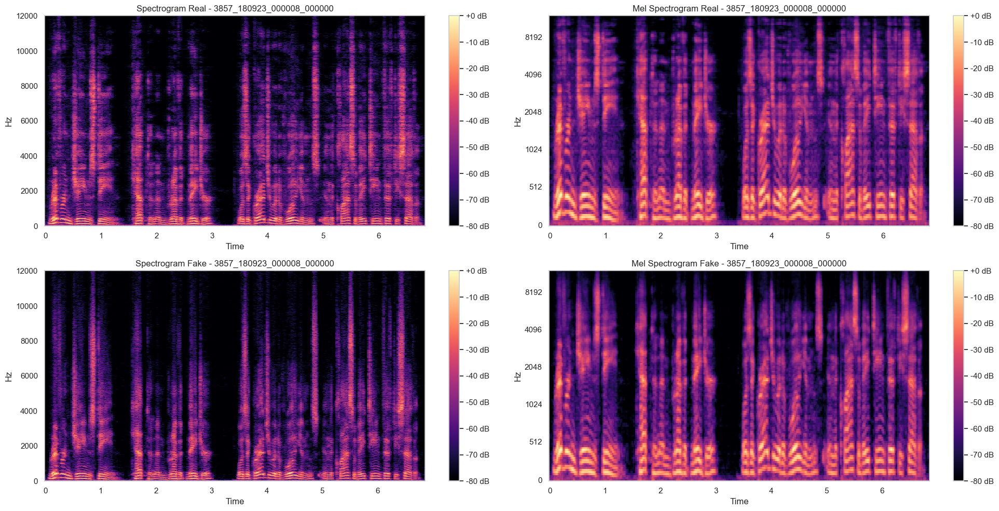

Real voice


Fake voice


In [334]:

num_pairs_to_select = 1
if num_total_pairs < num_pairs_to_select:
    print(f"There are only {num_total_pairs} pairs.")
    selected_pairs = df_pairs
else:
    selected_pairs = df_pairs.head(num_pairs_to_select)
print(selected_pairs[['base_name', 'file_path_real', 'file_path_fake']])

for idx, row in selected_pairs.iterrows():
    real_path = row['file_path_real']
    fake_path = row['file_path_fake']
    base_name = row['base_name']

    try:
        # Declaration
        y_real, sr_real = librosa.load(real_path, sr=None)
        y_fake, sr_fake = librosa.load(fake_path, sr=None)

        # Normalize the audio signals
        y_real = librosa.util.normalize(y_real)
        y_fake = librosa.util.normalize(y_fake)

        # Plot the Spectrograms
        fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))

        # Plotting real
        plot_spectrogram(y_real, sr_real, f"Spectrogram Real - {base_name}", ax=axes[0,0])
        plot_mel_spectrogram(y_real, sr_real, f"Mel Spectrogram Real - {base_name}", ax=axes[0,1])
        # Plotting fake
        plot_spectrogram(y_fake, sr_fake, f"Spectrogram Fake - {base_name}", ax=axes[1,0])
        plot_mel_spectrogram(y_fake, sr_fake, f"Mel Spectrogram Fake - {base_name}", ax=axes[1,1])

        plt.tight_layout()

        # Save the plot
        output_plot_path = f'{plot_dir}/{base_name}_spectrograms.png'
        fig.savefig(output_plot_path)

        # Show the plot
        plt.show()

        print("Real voice")
        display(Audio(data=y_real, rate=sr_real))
        print("Fake voice")
        display(Audio(data=y_fake, rate=sr_fake))

    except Exception as e:
        print(f"Error {base_name}: {e}")

All audio files have the same sampling rate.


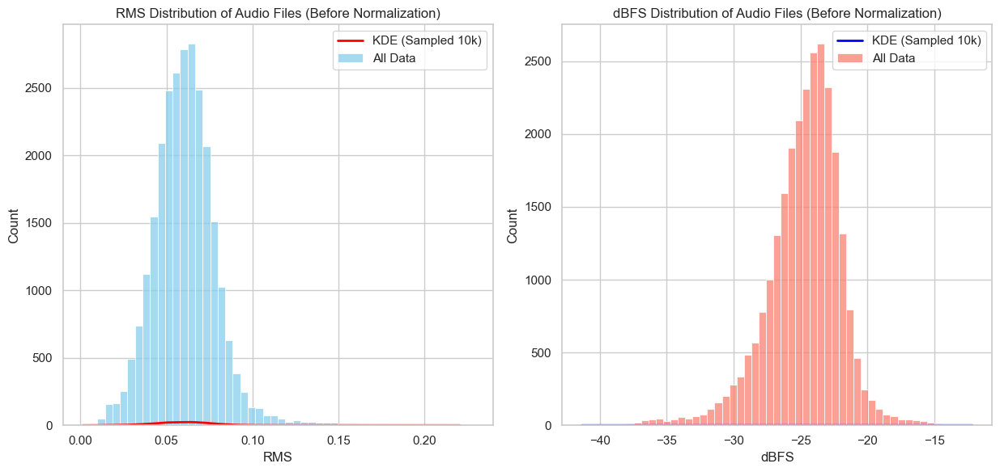

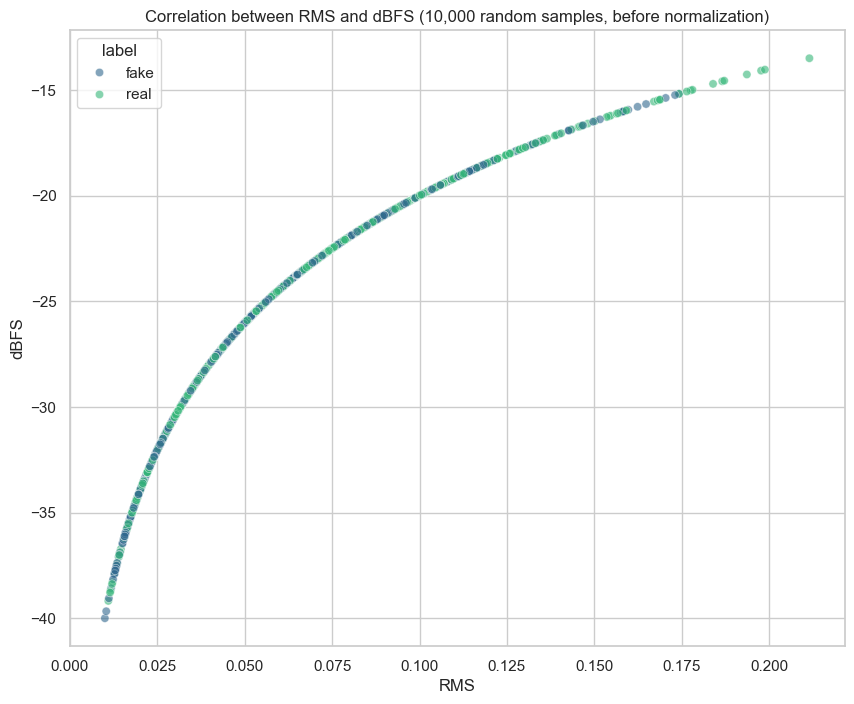

In [335]:
sns.set(style="whitegrid")
plt.figure(figsize=(18, 6))

# Check unique sampling rates
unique_sampling_rates = df_audio['sampling_rate'].unique()
if len(unique_sampling_rates) > 1:
    print(f'There are {len(unique_sampling_rates)} unique sampling rates')
else:
    print("All audio files have the same sampling rate.")

# RMS Distribution
plt.subplot(1, 3, 2)
df_rms_sample = df_audio['rms'].sample(n=10000, random_state=42)
sns.histplot(df_audio['rms'], bins=50, color='skyblue', label='All Data', stat='count', kde=False)
sns.kdeplot(df_rms_sample, color='red', label='KDE (Sampled 10k)', linewidth=2)
plt.title('RMS Distribution of Audio Files (Before Normalization)')
plt.xlabel('RMS')
plt.legend()

# dBFS Distribution
plt.subplot(1, 3, 3)
df_dbfs_sample = df_audio['dbfs'].sample(n=10000, random_state=42)
sns.histplot(df_audio['dbfs'], bins=50, color='salmon', label='All Data', stat='count', kde=False)
sns.kdeplot(df_dbfs_sample, color='blue', label='KDE (Sampled 10k)', linewidth=2)
plt.title('dBFS Distribution of Audio Files (Before Normalization)')
plt.xlabel('dBFS')
plt.legend()

plt.tight_layout()
plt.savefig(f'{plot_dir}/audio_data_distribution.png')
plt.show()

df_sample = df_audio.sample(n=10000, random_state=42)

plt.figure(figsize=(10, 8))
sns.scatterplot(x='rms', y='dbfs', hue='label', data=df_sample, palette='viridis', alpha=0.6)
plt.title('Correlation between RMS and dBFS (10,000 random samples, before normalization)')
plt.xlabel('RMS')
plt.ylabel('dBFS')
plt.savefig(f'{plot_dir}/rms_dbfs_before_norm.png')
plt.show()



dBFS and RMS has a logarithmic correlation

To ensure consistency, we must ensure that all files have the same sample rate. In this dataset, all audio are sampled at 24kHz.

In [336]:
df_audio['duration'].unique()

array([ 6.84      ,  6.07      , 11.68      , ..., 26.67733333,
       21.728     , 17.29066667])

Audio processing functions

Remove noise from lowcut=300.0 HZ to highcut=3400.0HZ

In [337]:
def remove_silence(y, sr, top_db=20):
    # Loại bỏ khoảng lặng ở đầu và cuối tín hiệu
    y_trimmed, _ = librosa.effects.trim(y, top_db=top_db)
    return y_trimmed

def bandpass_filter(y, sr, lowcut, highcut, order=3):
    nyq = 0.5 * sr  # Tần số Nyquist
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    y_filtered = lfilter(b, a, y)
    return y_filtered

def normalize_volume(y, desired_rms=0.1):
    # Tính RMS hiện tại của tín hiệu
    current_rms = np.sqrt(np.mean(y**2))
    # Tính tỷ lệ để điều chỉnh
    scalar = desired_rms / (current_rms + 1e-6)  # Thêm epsilon để tránh chia cho 0
    # Điều chỉnh tín hiệu
    y_normalized = y * scalar
    return y_normalized

def decrease_low_db(y, sr, threshold_db=-40, target_db=-80):
    """
    Minimise volumn below a threshold. This is useful to prevent environmental noise being considered by the model

    :param y: raw audio input (numpy array)
    :param sr: Sample rate (Hz)
    :param threshold_db: (e.g: -40 dB)
    :param target_db: the db to which all pieces below threshold will decrease (e.g: -80 dB)
    :return: (numpy array)
    """
    abs_y = np.abs(y)

    # Find the maximum ampltitude
    ref_amplitude = np.max(abs_y) if np.max(abs_y) > 0 else 1.0

    # calculate relative db
    y_db = 20 * np.log10(abs_y / ref_amplitude + 1e-10)

    mask = y_db < threshold_db

    desired_amplitude = 10 ** (target_db / 20) * ref_amplitude  # E.g: -80 dB
    y_adjusted = y.copy()

    y_adjusted[mask] = y_adjusted[mask] / (abs_y[mask] + 1e-10) * desired_amplitude

    return y_adjusted

Real: pre-processed


Real: post-processed


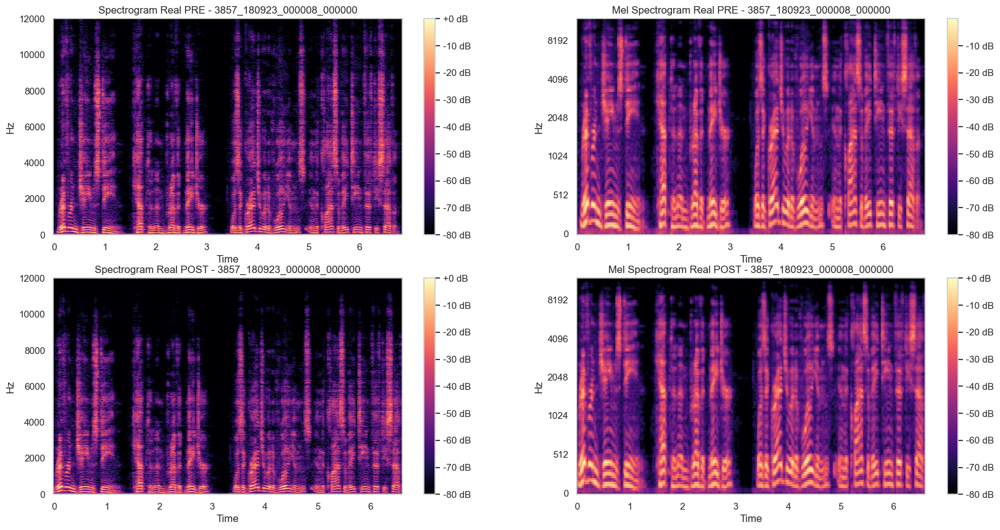

Fake: pre-processed


Fake: post-processed


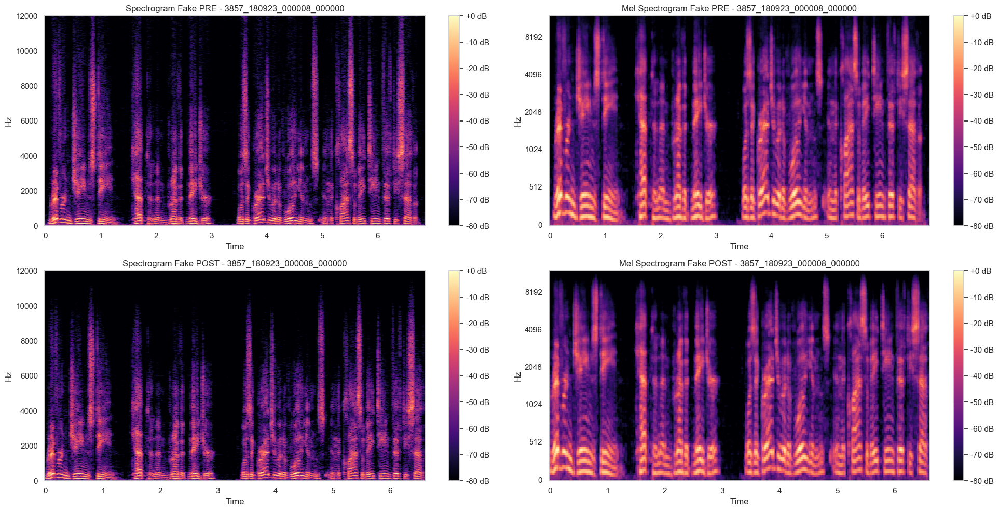

In [338]:
for idx, row in selected_pairs.iterrows():
    real_path = row['file_path_real']
    fake_path = row['file_path_fake']
    base_name = row['base_name']

    # Real audio

    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))
    y_real, sr_real = librosa.load(real_path, sr=None)
    print("Real: pre-processed")
    display(Audio(data=y_real, rate=sr_real))
    plot_spectrogram(y_real, sr_real, f"Spectrogram Real PRE - {base_name}", ax=axes[0,0])
    plot_mel_spectrogram(y_real, sr_real, f"Mel Spectrogram Real PRE - {base_name}", ax=axes[0,1])

    y_real = remove_silence(y_real, sr_real, top_db=20)
    y_real = bandpass_filter(y_real, sr_real, lowcut=100, highcut=6000, order=1)  # From 300Hz to 3400Hz
    print("Real: post-processed")
    display(Audio(data=y_real, rate=sr_real))

    plot_spectrogram(y_real, sr_real, f"Spectrogram Real POST - {base_name}", ax=axes[1,0])
    plot_mel_spectrogram(y_real, sr_real, f"Mel Spectrogram Real POST - {base_name}", ax=axes[1,1])
    plt.show()

    # Fake audio
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))
    y_fake, sr_fake = librosa.load(fake_path, sr=None)
    print("Fake: pre-processed")
    display(Audio(data=y_fake, rate=sr_fake))
    plot_spectrogram(y_fake, sr_fake, f"Spectrogram Fake PRE - {base_name}", ax=axes[0,0])
    plot_mel_spectrogram(y_fake, sr_fake, f"Mel Spectrogram Fake PRE - {base_name}", ax=axes[0,1])

    y_fake = remove_silence(y_fake, sr_fake, top_db=20)
    y_fake = bandpass_filter(y_fake, sr_fake, lowcut=100, highcut=6000, order=1)
    print("Fake: post-processed")
    display(Audio(data=y_fake, rate=sr_fake))

    plot_spectrogram(y_fake, sr_fake, f"Spectrogram Fake POST - {base_name}", ax=axes[1,0])
    plot_mel_spectrogram(y_fake, sr_fake, f"Mel Spectrogram Fake POST - {base_name}", ax=axes[1,1])
    plt.tight_layout()
    plt.show()

Pre-processed Real


Post-processed Real


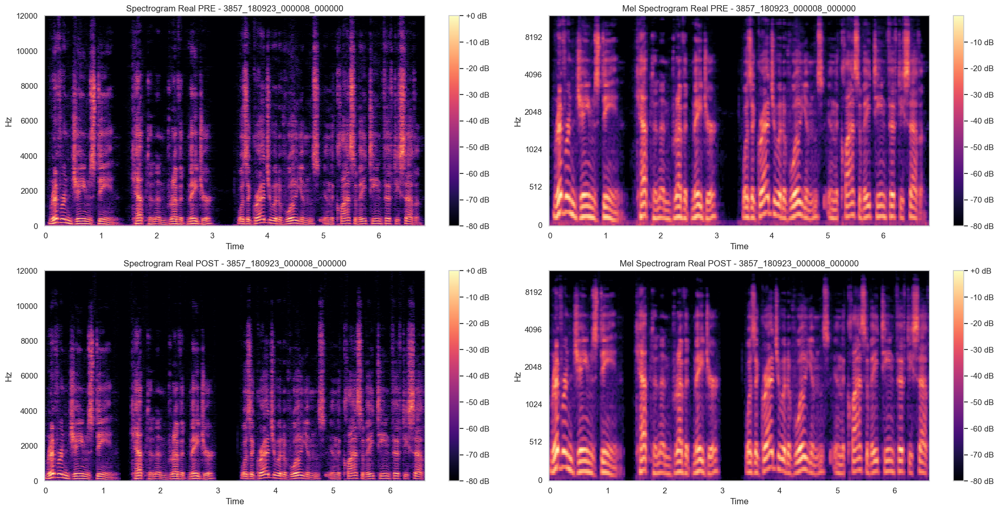

Pre-processed Fake


Post-processed Fake


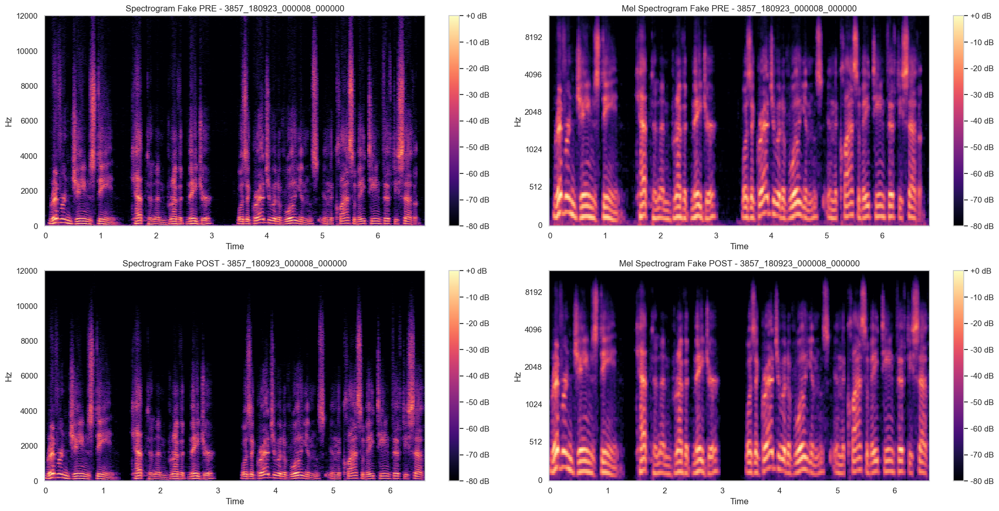

In [339]:
for idx, row in selected_pairs.iterrows():
    real_path = row['file_path_real']
    fake_path = row['file_path_fake']
    base_name = row['base_name']

    try:
        # -------------------------
        # Real
        # -------------------------
        fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))
        y_real, sr_real = librosa.load(real_path, sr=None)
        print("Pre-processed Real")
        display(Audio(data=y_real, rate=sr_real))

        plot_spectrogram(y_real, sr_real, f"Spectrogram Real PRE - {base_name}", ax=axes[0,0])
        plot_mel_spectrogram(y_real, sr_real, f"Mel Spectrogram Real PRE - {base_name}", ax=axes[0,1])

        y_real = remove_silence(y_real, sr_real, top_db=20)
        y_real = bandpass_filter(y_real, sr_real, lowcut=200, highcut=4000, order=1)  # Ví dụ dải tần từ 300Hz đến 3400Hz
        y_real_cut = decrease_low_db(y_real, sr_real, threshold_db=-50)
        print("Post-processed Real")
        display(Audio(data=y_real, rate=sr_real))

        plot_spectrogram(y_real_cut, sr_real, f"Spectrogram Real POST - {base_name}", ax=axes[1,0])
        plot_mel_spectrogram(y_real_cut, sr_real, f"Mel Spectrogram Real POST - {base_name}", ax=axes[1,1])

        plt.tight_layout()
        plt.show()

        # -------------------------
        # Fake
        # -------------------------
        fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))
        y_fake, sr_fake = librosa.load(fake_path, sr=None)
        print("Pre-processed Fake")
        display(Audio(data=y_real, rate=sr_real))

        plot_spectrogram(y_fake, sr_fake, f"Spectrogram Fake PRE - {base_name}", ax=axes[0,0])
        plot_mel_spectrogram(y_fake, sr_fake, f"Mel Spectrogram Fake PRE - {base_name}", ax=axes[0,1])

        y_fake = remove_silence(y_fake, sr_fake, top_db=20)
        y_fake = bandpass_filter(y_fake, sr_fake, lowcut=200, highcut=4000, order=1)
        y_fake_cut = decrease_low_db(y_fake, sr_fake, threshold_db=-55)
        print("Post-processed Fake")
        display(Audio(data=y_real, rate=sr_real))


        plot_spectrogram(y_fake_cut, sr_fake, f"Spectrogram Fake POST - {base_name}", ax=axes[1,0])
        plot_mel_spectrogram(y_fake_cut, sr_fake, f"Mel Spectrogram Fake POST - {base_name}", ax=axes[1,1])

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error {base_name}: {e}")

# Feature extraction

In [340]:
%%capture
%pip install opensmile spafe

In [ ]:
from utils import extract_features, process_audio_files

In [342]:
# Đường dẫn đến một tệp âm thanh mẫu
sample_file = 'content/LibriSeVoc/gt/19_198_000010_000003.wav'

# Đọc tệp âm thanh dưới dạng mono
y, sr = librosa.load(sample_file, sr=None, mono=True)

# Trích xuất đặc trưng
features = extract_features(y, sr, n_mfcc=30)

# Kiểm tra số lượng đặc trưng
print(f"Length of features: {len(features)}")  # Nên in ra 39

# Hiển thị các đặc trưng LPC
lpc_mean = features[-13:]  # Lấy 13 hệ số LPC cuối cùng
print(f"LPC Mean: {lpc_mean}")

Length of features: 30
LPC Mean: [ 0.8906426 -1.8286726  3.1643164 -1.5518299  4.0855927 -2.4155142
  7.0722203  3.1888175  1.3563838  3.2680445  6.6792    -1.043402
  1.0294244]


In [343]:
features_list = []
labels_list = []

In [ ]:
process_audio_files(file_paths, labels, output_csv='./output/data/features.csv', sample_size= 15000,\
                    n_mfcc=30, n_chroma=0, n_spectral_contrast=0, lpc_order=30)

In [ ]:
df = pd.read_csv('./output/data/features.csv')
df.shape

(15000, 33)